# Setup

Clone repo, install dependencies and check PyTorch and GPU.

In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt  # install dependencies

import torch
from IPython.display import Image, clear_output  # to display images

clear_output()
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.9.0+cu102 (Tesla T4)


In [2]:
from google.colab import drive
drive.mount('/content/drive')



Mounted at /content/drive


In [ ]:
# Tensorboard  (optional)
%load_ext tensorboard
%tensorboard --logdir runs/train

<IPython.core.display.Javascript object>

In [3]:
pip install -U albumentations

     |████████████████████████████████| 102kB 11.3MB/s 
     |████████████████████████████████| 37.2MB 80kB/s 
  Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


In [4]:
# Train YOLOv5s3  on WaterLevel for 3 epochs
!python train.py --img 1200 --batch 10 --epochs 50 --data /content/drive/MyDrive/juice/juice.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt --name yolov5s_level --cache

train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=/content/drive/MyDrive/juice/juice.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=50, batch_size=10, img_size=[1200], rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache_images=True, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, entity=None, name=yolov5s_level, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, upload_dataset=False, bbox_interval=-1, save_period=-1, artifact_alias=latest, local_rank=-1
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v5.0-290-g62409ee torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

hyperparameters: lr0=0.01, lrf=0.2, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=

## Local Logging

All results are logged by default to `runs/train`, with a new experiment directory created for each new training as `runs/train/exp2`, `runs/train/exp3`, etc. View train and test jpgs to see mosaics, labels, predictions and augmentation effects. Note a **Mosaic Dataloader** is used for training (shown below), a new concept developed by Ultralytics and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

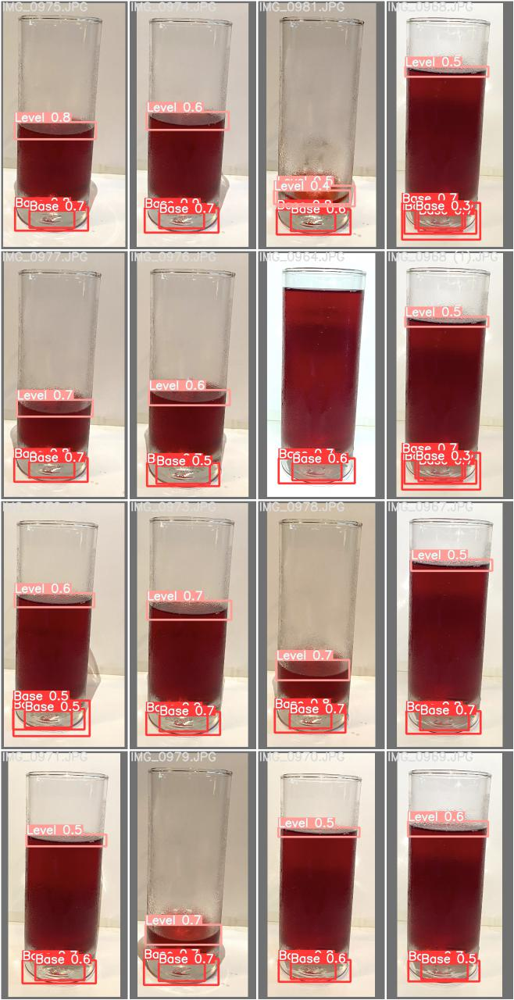

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_level/train_batch0.jpg', width=800)  # train batch 0 mosaics and labels
Image(filename='/content/yolov5/runs/train/yolov5s_level/val_batch0_labels.jpg', width=800)  # test batch 0 labels
Image(filename='runs/train/yolov5s_level/val_batch0_pred.jpg', width=800)  # test batch 0 predictions

Training results are automatically logged to [Tensorboard](https://www.tensorflow.org/tensorboard) and `runs/train/exp/results.txt`, which is plotted as `results.png` (below) after training completes. You can also plot any `results.txt` file manually:

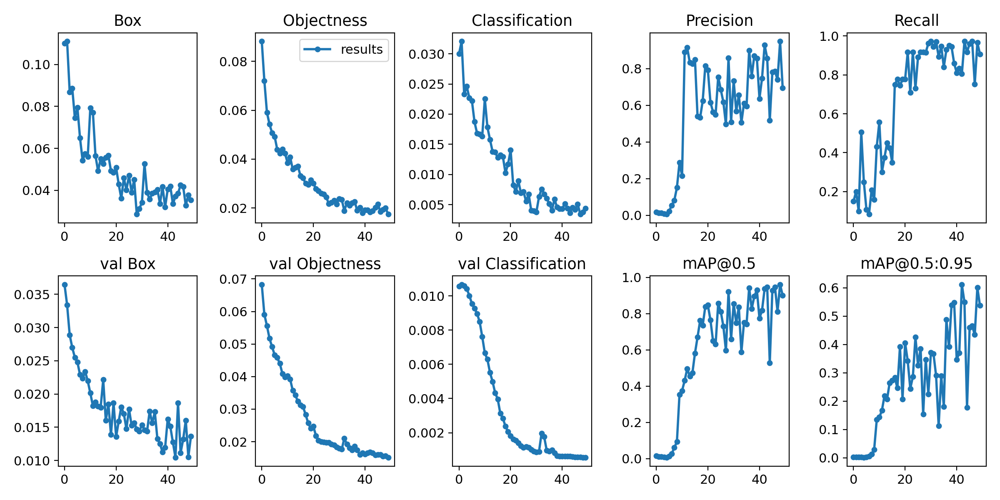

In [ ]:
from utils.plots import plot_results 
plot_results(save_dir='runs/train/yolov5s_level')  # plot all results*.txt files in 'runs/train/exp'
Image(filename='runs/train/yolov5s_level/results.png', width=800)

<p align="left"><img width="800" alt="COCO128 Training Results" src="https://github.com/ultralytics/yolov5/releases/download/v1.0/results_COCO128.png"></p>

In [ ]:
!python detect.py --weights runs/train/yolov5s_level/weights/last.pt --img 1200 --conf 0.5 --source /content/drive/MyDrive/juice/images/val/IMG_0967.JPG --save-txt --save-conf

 

detect: weights=['runs/train/yolov5s_level/weights/last.pt'], source=/content/drive/MyDrive/juice/images/val/IMG_0967.JPG, imgsz=1200, conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False
YOLOv5 🚀 v5.0-290-g62409ee torch 1.9.0+cu102 CUDA:0 (Tesla K80, 11441.1875MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
Model Summary: 224 layers, 7056607 para

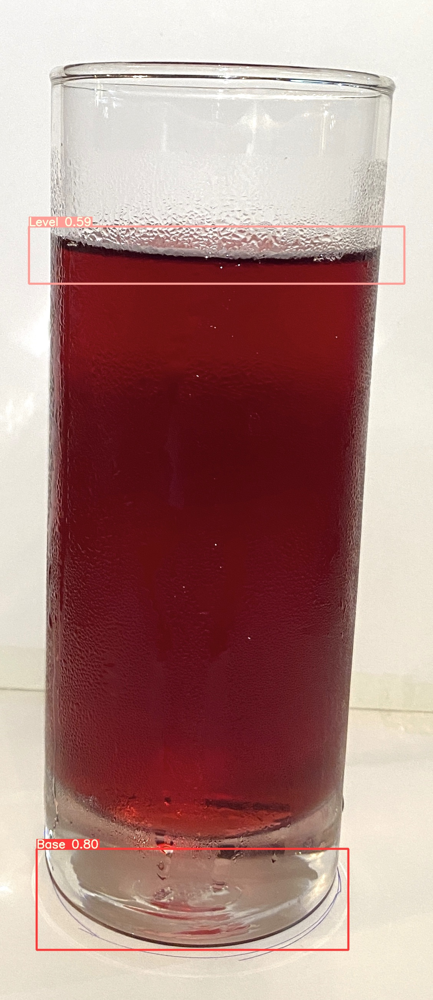

In [ ]:
Image(filename='runs/detect/exp/IMG_0967.JPG', width=800)

In [ ]:
import torch

# To load the custom trained model
# model = torch.hub.load('path/to/yolov5', 'custom', path='path/to/best.pt', source='local')  
model = torch.hub.load('', 'custom', path='runs/train/yolov5s_level/weights/last.pt', source='local')
# Inference Settings
# Inference settings such as confidence threshold, NMS IoU threshold, and classes filter are model attributes, and can be modified by:

model.conf = 0.3  # confidence threshold (0-1)
model.iou = 0.45  # NMS IoU threshold (0-1)
# model.classes = None  # (optional list) filter by class, i.e. = [0, 15, 16] for persons, cats and dogs


# Images
imgs = ['/content/drive/MyDrive/juice/images/val/IMG_0967.JPG']  # batch of images

# Inference
results = model(imgs)

# Results
results.print()
results.save()  # or .show()
results.xyxy[0]  # img1 predictions (tensor)
results.pandas().xyxy[0]  # img1


requirements: PyYAML>=5.3.1 not found and is required by YOLOv5, attempting auto-update...


YOLOv5 🚀 v5.0-290-g62409ee torch 1.9.0+cu102 CUDA:0 (Tesla K80, 11441.1875MB)




requirements: 1 package updated per /content/yolov5/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for updates to take effect



Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
Model Summary: 224 layers, 7056607 parameters, 0 gradients, 16.3 GFLOPs
Adding AutoShape... 


image 1/1: 2603x1128 1 Base, 1 Level
Speed: 77.3ms pre-process, 26.2ms inference, 2.6ms NMS per image at shape (1, 3, 640, 288)
Saved IMG_0967.jpg to runs/hub/exp


,xmin,ymin,xmax,ymax,confidence,class,name
0,30.690041,2210.516602,955.975220,2478.950928,0.617188,0,Base
1,104.407822,589.742249,1062.230591,697.522705,0.479736,1,Level


In [ ]:
# Image(filename='runs/detect/exp/IMG_0978.JPG', width=400) 
baseminy=results.pandas().xyxy[0]["ymin"]  # img1
levelmaxy=results.pandas().xyxy[0]["ymax"]
toplevelmax=results.pandas().xyxy[0]["ymax"]
tm=toplevelmax[1]-500
bm=baseminy[0]
lm=levelmaxy[1]

print(tm,lm,bm)
#Get total glass length
lengthofglass=bm-tm

#Get total liquid level length
lenghtofliquidlevel=bm-lm

print(lengthofglass,lenghtofliquidlevel)

#Get percentage of liquid
level=lenghtofliquidlevel/lengthofglass*100

print(f"Predicted level of liquid: {level:.2f}%")

197.522705078125 697.522705078125 2210.5166015625
2012.993896484375 1512.993896484375
Predicted level of liquid: 75.16%


In [ ]:
import torch
from PIL import Image


def copy_attr(a, b, include=(), exclude=()):
    # Copy attributes from b to a, options to only include [...] and to exclude [...]
    for k, v in b.__dict__.items():
        if (len(include) and k not in include) or k.startswith('_') or k in exclude:
            continue
        else:
            setattr(a, k, v)

# my network so slow that I can't download your model above successfully :(
# so I just use ultralytics's pretrained model here 
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True, classes=2,autoshape=False)
checkpoint_ = torch.load('runs/train/yolov5s_level/weights/last.pt')['model']
model.load_state_dict(checkpoint_.state_dict())

copy_attr(model, checkpoint_, include=('yaml', 'nc', 'hyp', 'names', 'stride'), exclude=())

model = model.fuse().autoshape()

img = ['/content/drive/MyDrive/juice/images/val/IMG_0967.JPG']  # batch of images
output = model(img)

print(f'prediction: {output.pred}')
output.pandas().xyxy[0]

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master


requirements: PyYAML>=5.3.1 not found and is required by YOLOv5, attempting auto-update...


YOLOv5 🚀 v5.0-290-g62409ee torch 1.9.0+cu102 CUDA:0 (Tesla K80, 11441.1875MB)

Overriding model.yaml nc=80 with nc=2

                 from  n    params  module                                  arguments                     
  0                -1  1      3520  models.common.Focus                     [3, 32, 3]                    
  1                -1  1     18560  models.common.Conv                      [32, 64, 3, 2]                
  2                -1  1     18816  models.common.C3                        [64, 64, 1]                   
  3                -1  1     73984  models.common.Conv                      [64, 128, 3, 2]               
  4                -1  1    156928  models.common.C3                        [128, 128, 3]                 
  5                -1  1    295424  models.common.Conv                      [128, 256, 3, 2]              



requirements: 1 package updated per /root/.cache/torch/hub/ultralytics_yolov5_master/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for updates to take effect



  6                -1  1    625152  models.common.C3                        [256, 256, 3]                 
  7                -1  1   1180672  models.common.Conv                      [256, 512, 3, 2]              
  8                -1  1    656896  models.common.SPP                       [512, 512, [5, 9, 13]]        
  9                -1  1   1182720  models.common.C3                        [512, 512, 1, False]          
 10                -1  1    131584  models.common.Conv                      [512, 256, 1, 1]              
 11                -1  1         0  torch.nn.modules.upsampling.Upsample    [None, 2, 'nearest']          
 12           [-1, 6]  1         0  models.common.Concat                    [1]                           
 13                -1  1    361984  models.common.C3                        [512, 256, 1, False]          
 14                -1  1     33024  models.common.Conv                      [256, 128, 1, 1]              
 15                -1  1         0  t

prediction: [tensor([[3.06900e+01, 2.21052e+03, 9.55975e+02, 2.47895e+03, 6.17188e-01, 0.00000e+00],
        [1.04408e+02, 5.89742e+02, 1.06223e+03, 6.97523e+02, 4.79736e-01, 1.00000e+00]], device='cuda:0')]


,xmin,ymin,xmax,ymax,confidence,class,name
0,30.690041,2210.516602,955.975220,2478.950928,0.617188,0,Base
1,104.407822,589.742249,1062.230591,697.522705,0.479736,1,Level


In [ ]:
output.pandas().xyxy[0]

,xmin,ymin,xmax,ymax,confidence,class,name
0,107.458214,2147.475098,850.228394,2537.925293,0.429443,0,Base
1,40.858013,525.684021,1102.902466,779.883240,0.369629,1,Level


In [ ]:
Image(filename='runs/hub/exp/IMG_0967.jpg', width=800)

TypeError: ignored